# Data Exploration

In [2]:
import pandas as pd
import plotly.express as px

Import the data base

In [3]:
path = r"../litology_exploration/Data/texture.csv"
df_geo = pd.read_csv(path, sep=",")
df_geo.head()

C:\Users\neybe\AppData\Local\Temp\ipykernel_15496\1621192502.py:2: DtypeWarning: Columns (14) have mixed types. Specify dtype option on import or set low_memory=False.
  df_geo = pd.read_csv(path, sep=",")


,GROUP,DB_ID,FIELD_NO,PROJECT,CRUISE_ID,CONTACT,AREA,LATITUDE,LONGITUDE,DEPTH_M,...,PHI_6,PHI_7,PHI_8,PHI_9,PHI_10,PHI_11,ANALYST,ANAL_COMM,LITHOLOGY,COMMENTS
0,1,A002,A002,USGS/WHOI,AB3 70,NaN,NANTUCKET SHOALS,41.10000,-69.28333,51.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,NaN,Verbal description made at a later date,GRANULE-BOULDER,BOTTOM TEMP 8.2
1,1,A003,A003,USGS/WHOI,AB3 70,NaN,SW CHANNEL,40.85000,-68.91667,66.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,NaN,Verbal description made at a later date,COARSE SAND,BOTTOM TEMP 8.4
2,1,A012,A012,USGS/WHOI,AB3 70,NaN,GEORGES BANK,41.38333,-66.98333,69.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,NaN,NaN,MEDIUM SAND,BOTTOM TEMP 8.4
3,1,A015,A015,USGS/WHOI,AB3 70,NaN,GEORGES BANK,41.63333,-67.95000,20.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,NaN,NaN,MEDIUM SAND,BOTTOM TEMP 8.2
4,1,A016,A016,USGS/WHOI,AB3 70,NaN,GEORGES BANK,41.35000,-67.98333,33.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,NaN,Verbal description made at a later date,MEDIUM SAND,BOTTOM TEMP 7.9


In [4]:
df = df_geo.fillna(0)
df.head()

,GROUP,DB_ID,FIELD_NO,PROJECT,CRUISE_ID,CONTACT,AREA,LATITUDE,LONGITUDE,DEPTH_M,...,PHI_6,PHI_7,PHI_8,PHI_9,PHI_10,PHI_11,ANALYST,ANAL_COMM,LITHOLOGY,COMMENTS
0,1,A002,A002,USGS/WHOI,AB3 70,0,NANTUCKET SHOALS,41.10000,-69.28333,51.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0,Verbal description made at a later date,GRANULE-BOULDER,BOTTOM TEMP 8.2
1,1,A003,A003,USGS/WHOI,AB3 70,0,SW CHANNEL,40.85000,-68.91667,66.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0,Verbal description made at a later date,COARSE SAND,BOTTOM TEMP 8.4
2,1,A012,A012,USGS/WHOI,AB3 70,0,GEORGES BANK,41.38333,-66.98333,69.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0,0,MEDIUM SAND,BOTTOM TEMP 8.4
3,1,A015,A015,USGS/WHOI,AB3 70,0,GEORGES BANK,41.63333,-67.95000,20.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0,0,MEDIUM SAND,BOTTOM TEMP 8.2
4,1,A016,A016,USGS/WHOI,AB3 70,0,GEORGES BANK,41.35000,-67.98333,33.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0,Verbal description made at a later date,MEDIUM SAND,BOTTOM TEMP 7.9


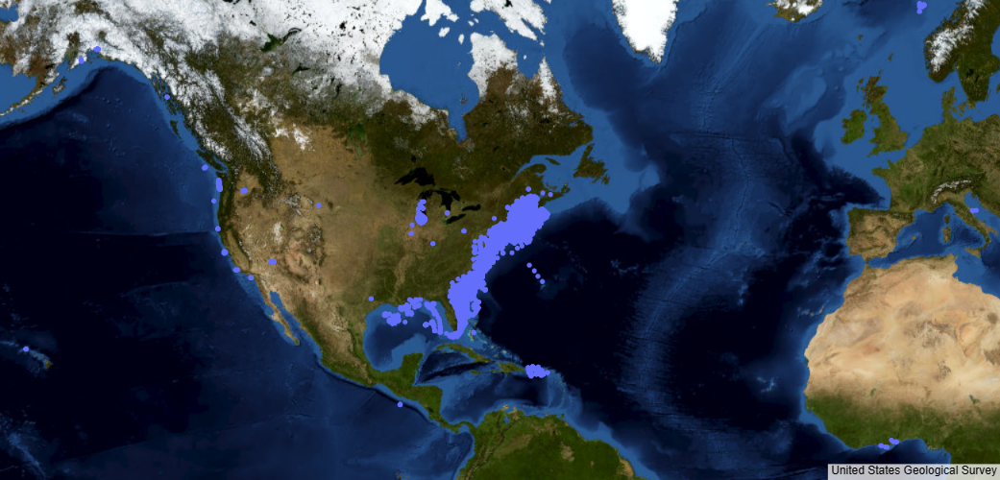

In [50]:
fig = px.scatter_mapbox(
                        df, lat="LATITUDE",
                        lon="LONGITUDE",
                        hover_name="AREA",
                        hover_data="LITHOLOGY",
                        zoom=2,
                        height=500
                        )
fig.update_layout(
                    mapbox_style="white-bg",mapbox_layers=[
                        {
                            "below": 'traces',
                            "sourcetype": "raster",
                            "sourceattribution": "United States Geological Survey",
                            "source": [
                                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
                            ]
                        }
                    ]
                )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

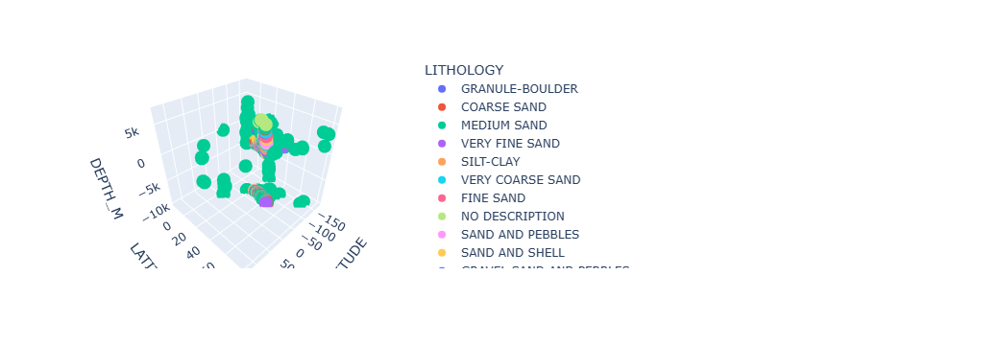

In [29]:
fig = px.scatter_3d(
                    df, x='LONGITUDE',
                    y='LATITUDE',
                    z='DEPTH_M',
                    color='LITHOLOGY'
                    )
fig.show()

In [9]:
Areas = df_geo['AREA'].unique()
Areas

array(['NANTUCKET SHOALS', 'SW CHANNEL', 'GEORGES BANK', ...,
       'NOROIT SEAMOUNT', 'N WALL VIB', 'FIRE ISLAND, NY'], dtype=object)

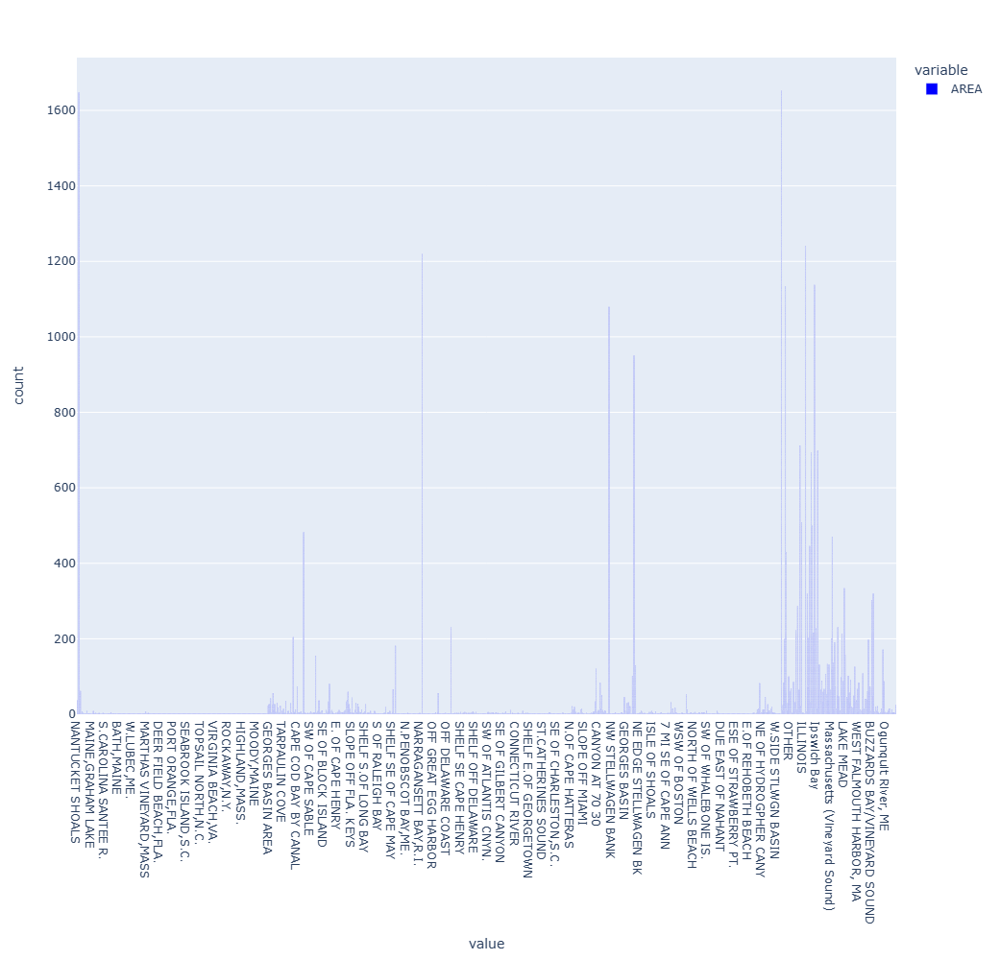

In [18]:
fig = px.bar(df_geo['AREA'], color_discrete_sequence=['blue'])
fig.update_layout(
                    autosize=True,
                    width=1000,
                    height=1000
                    )
fig.show()

We are going to choose the Area "NEW ENGLAND"

In [62]:
df_NEW_ENGLAND = df_geo[df_geo["AREA"] == "NEW ENGLAND"]
df_NEW_ENGLAND.head()

,GROUP,DB_ID,FIELD_NO,PROJECT,CRUISE_ID,CONTACT,AREA,LATITUDE,LONGITUDE,DEPTH_M,...,PHI_6,PHI_7,PHI_8,PHI_9,PHI_10,PHI_11,ANALYST,ANAL_COMM,LITHOLOGY,COMMENTS
5986,3,AC589,909-5,SEDDT2,JOHNSON-163,DTWICHELL,NEW ENGLAND,40.050,-70.345,183.0,...,5.32,2.82,2.61,1.89,1.22,0.44,NaN,NaN,NaN,NaN
5987,3,AC590,909-6,SEDDT2,JOHNSON-163,DTWICHELL,NEW ENGLAND,40.046,-70.346,188.0,...,15.11,15.11,16.29,16.17,16.90,9.70,NaN,NaN,NaN,NaN
5988,3,AC591,909-7,SEDDT2,JOHNSON-163,DTWICHELL,NEW ENGLAND,40.046,-70.346,188.0,...,6.01,3.13,2.93,2.12,1.41,0.62,NaN,NaN,NaN,NaN
5989,3,AC592,910-3,SEDDT2,JOHNSON-163,DTWICHELL,NEW ENGLAND,40.209,-70.337,103.0,...,9.30,5.33,3.42,2.14,1.32,0.50,NaN,NaN,NaN,NaN
5990,3,AC593,911-1,SEDDT2,JOHNSON-163,DTWICHELL,NEW ENGLAND,40.046,-70.227,183.0,...,3.05,1.85,1.71,1.25,0.81,0.29,NaN,NaN,NaN,NaN


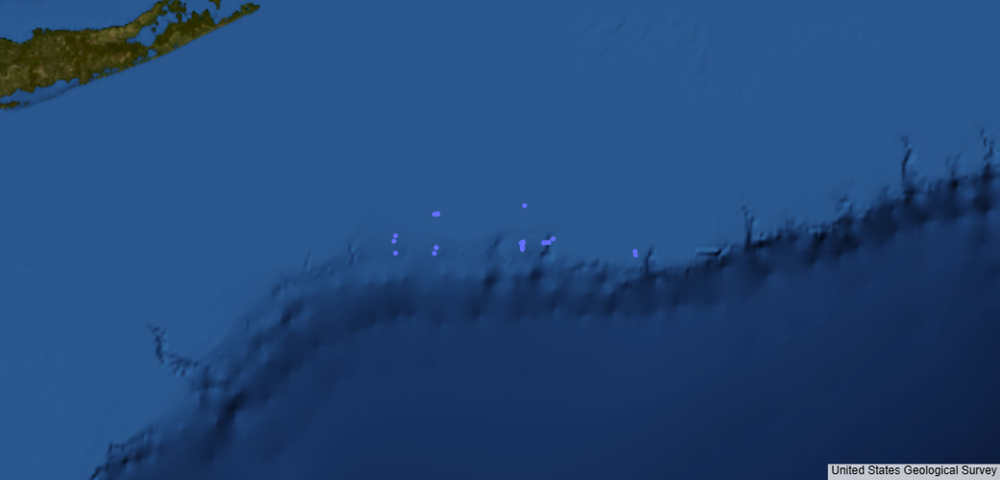

In [45]:
fig = px.scatter_mapbox(
                        df_NEW_ENGLAND, lat="LATITUDE",
                        lon="LONGITUDE",
                        hover_name="AREA",
                        hover_data="CLASSIFICATION",
                        zoom=7,
                        height=500
                        )
fig.update_layout(
                    mapbox_style="white-bg",mapbox_layers=[
                        {
                            "below": 'traces',
                            "sourcetype": "raster",
                            "sourceattribution": "United States Geological Survey",
                            "source": [
                                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
                            ]
                        }
                    ]
                )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [30]:
df_NEW_ENGLAND.describe()

,GROUP,LATITUDE,LONGITUDE,DEPTH_M,T_DEPTH,B_DEPTH,MONTH_COLL,YEAR_COLL,MONTH_ANAL,DAY_ANAL,...,PHI_2,PHI_3,PHI_4,PHI_5,PHI_6,PHI_7,PHI_8,PHI_9,PHI_10,PHI_11
count,30.0,30.000000,30.000000,30.000000,30.0,30.0,30.0,30.0,30.0,30.000000,...,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.00000,30.000000,30.000000
mean,3.0,40.058633,-70.477599,-477.766667,-9999.0,-9999.0,7.0,1984.0,11.0,26.500000,...,17.578333,22.235000,19.020000,13.566000,8.138000,4.822000,4.136667,3.52700,2.936667,1.378333
std,0.0,0.058716,0.373464,2588.811399,0.0,0.0,0.0,0.0,0.0,0.776819,...,12.865094,11.034274,12.196369,8.491354,5.542859,4.117735,3.951605,4.07678,4.223736,2.320710
min,3.0,39.993000,-71.084000,-9999.000000,-9999.0,-9999.0,7.0,1984.0,11.0,26.000000,...,0.970000,1.380000,1.610000,1.650000,1.170000,0.770000,0.710000,0.53000,0.380000,0.130000
25%,3.0,40.024250,-70.842750,134.000000,-9999.0,-9999.0,7.0,1984.0,11.0,26.000000,...,7.425000,17.635000,11.415000,8.690000,4.132500,2.095000,1.795000,1.36750,0.887500,0.322500
50%,3.0,40.046000,-70.350000,189.000000,-9999.0,-9999.0,7.0,1984.0,11.0,26.000000,...,16.625000,25.385000,15.785000,11.950000,6.020000,3.110000,2.490000,1.86000,1.260000,0.460000
75%,3.0,40.053000,-70.227000,228.250000,-9999.0,-9999.0,7.0,1984.0,11.0,27.000000,...,20.757500,27.957500,25.245000,14.977500,12.700000,6.267500,4.957500,3.07250,1.910000,0.687500
max,3.0,40.209000,-69.702010,336.000000,-9999.0,-9999.0,7.0,1984.0,11.0,28.000000,...,47.960000,42.900000,49.950000,35.050000,22.990000,17.330000,16.290000,16.17000,16.900000,9.700000


In [31]:
df_NEW_ENGLAND.columns

Index(['GROUP', 'DB_ID', 'FIELD_NO', 'PROJECT', 'CRUISE_ID', 'CONTACT', 'AREA',
       'LATITUDE', 'LONGITUDE', 'DEPTH_M', 'T_DEPTH', 'B_DEPTH', 'DEVICE',
       'MONTH_COLL', 'DAY_COLL', 'YEAR_COLL', 'MONTH_ANAL', 'DAY_ANAL',
       'YEAR_ANAL', 'WEIGHT', 'GRAVEL_PCT', 'SAND_PCT', 'SILT_PCT', 'CLAY_PCT',
       'CLASSIFICATION', 'MEDIAN', 'MEAN', 'STDEV', 'SKEWNESS', 'KURTOSIS',
       'MODE1CLASS', 'MODE1FREQ', 'MODE2CLASS', 'MODE2FREQ', 'MODE3CLASS',
       'MODE3FREQ', 'NMODES', 'PHIM5', 'PHIM4', 'PHIM3', 'PHIM2', 'PHIM1',
       'PHI_0', 'PHI_1', 'PHI_2', 'PHI_3', 'PHI_4', 'PHI_5', 'PHI_6', 'PHI_7',
       'PHI_8', 'PHI_9', 'PHI_10', 'PHI_11', 'ANALYST', 'ANAL_COMM',
       'LITHOLOGY', 'COMMENTS'],
      dtype='object')

In [32]:
df_NEW_ENGLAND["CLASSIFICATION"].unique()

array(['SILTY SAND', 'CLAYEY SILT', 'SAND', 'SANDY SILT'], dtype=object)

In [33]:
df_NEW_ENGLAND["LITHOLOGY"].unique()

array([nan], dtype=object)

We can see that the LITHOLOGY columns doesn't have data, that's why we are going to work with GRAVEL_PCT, SAND_PCT, SILT_PCT AND CLAY_PCT, to verify the CLASSIFICATION

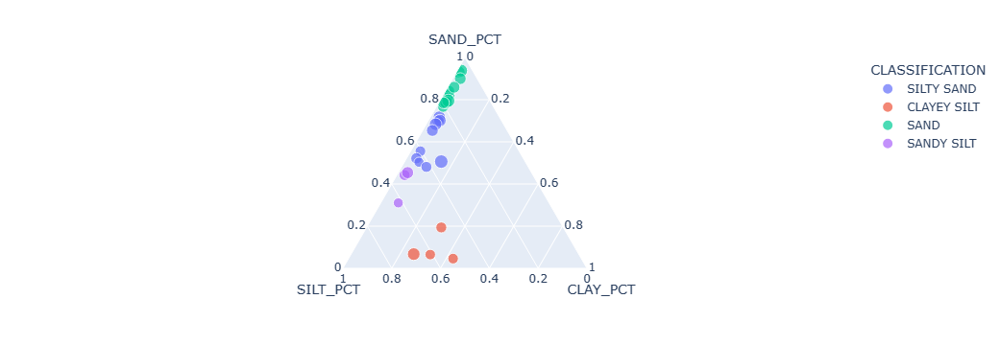

In [42]:
fig = px.scatter_ternary(
                        df_NEW_ENGLAND,
                        a = 'SAND_PCT',
                        b = 'SILT_PCT',
                        c = 'CLAY_PCT',
                        color = "CLASSIFICATION",
                        size = "WEIGHT",
                        size_max = 10
                        )

fig.show()

In [63]:
df_NEW_ENGLAND = df_NEW_ENGLAND.query("DEPTH_M > -9")

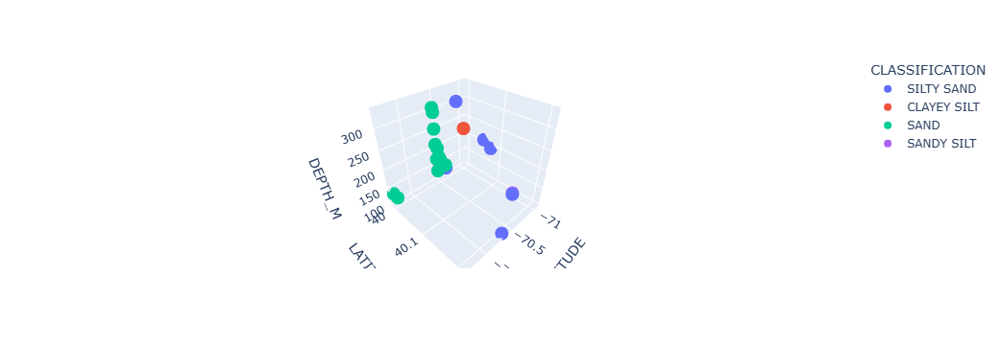

In [64]:
fig = px.scatter_3d(
                    df_NEW_ENGLAND,
                    x='LONGITUDE',
                    y='LATITUDE',
                    z='DEPTH_M',
                    color='CLASSIFICATION'
                    )
fig.show()

Plot other data, the info from the AREA "CHESAPEAKE BAY"

In [87]:
df_CHESAPEAKE_BAY = df_geo[df_geo["AREA"] == "CHESAPEAKE BAY"]
df_CHESAPEAKE_BAY.head()

,GROUP,DB_ID,FIELD_NO,PROJECT,CRUISE_ID,CONTACT,AREA,LATITUDE,LONGITUDE,DEPTH_M,...,PHI_6,PHI_7,PHI_8,PHI_9,PHI_10,PHI_11,ANALYST,ANAL_COMM,LITHOLOGY,COMMENTS
1628,2,1975,1975,USGS/WHOI,AST 2,NaN,CHESAPEAKE BAY,39.40833,-76.04833,8.0,...,24.3,18.3,10.6,7.0,6.2,12.8,NaN,NaN,"TOP 1-2 CM BROWN SILT,THEN A BROWNISH SILTY CLAY",FRAUTSCHY
1629,2,1976,1976,USGS/WHOI,AST 2,NaN,CHESAPEAKE BAY,39.30333,-76.22667,7.0,...,15.0,14.1,12.1,9.8,8.1,18.4,NaN,NaN,"BROWNISH-GRAY SILTY CLAY,UNDER10 CM BECOMES GRAY",FRAUTSCHY
1630,2,1977,1977,USGS/WHOI,AST 2,NaN,CHESAPEAKE BAY,39.16167,-76.31500,8.0,...,10.9,14.4,15.6,13.5,11.2,26.1,NaN,NaN,"BROWN CLAY,BECOMES GRAYISH-BROWN",FRAUTSCHY
1631,2,1978,1978,USGS/WHOI,AST 2,NaN,CHESAPEAKE BAY,38.99667,-76.37500,16.0,...,5.8,8.6,14.5,17.2,15.2,33.1,NaN,NaN,"BROWNISH-GRAY TO DARK GRAY SILTY CLAY,SOME FIN...",FRAUTSCHY
1632,2,1979,1979,USGS/WHOI,AST 2,NaN,CHESAPEAKE BAY,38.83500,-76.42000,13.0,...,4.9,7.0,12.5,16.6,15.1,39.6,NaN,NaN,"GRAY,SILTY CLAY,SOME VERY FINE SAND GRAINS",FRAUTSCHY


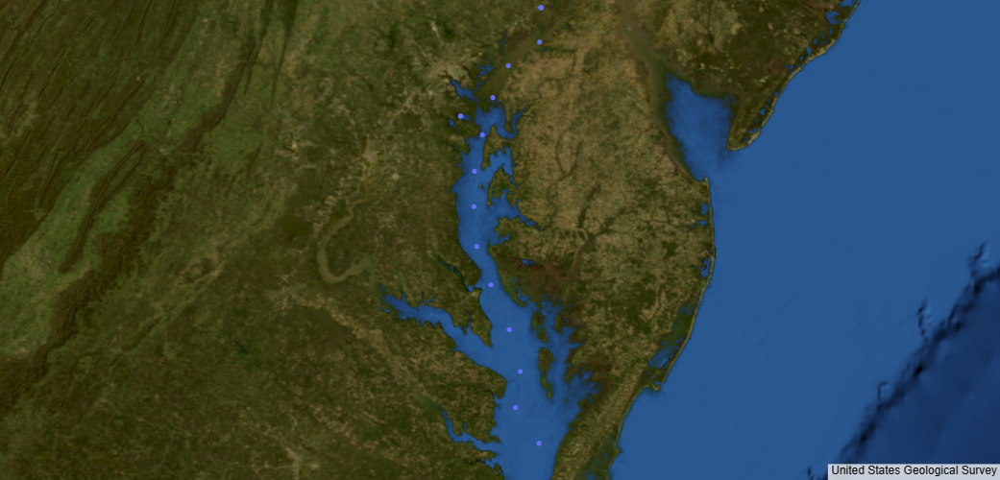

In [88]:
fig = px.scatter_mapbox(
                        df_CHESAPEAKE_BAY, lat="LATITUDE",
                        lon="LONGITUDE",
                        hover_name="AREA",
                        hover_data="LITHOLOGY",
                        zoom=7,
                        height=500
                        )
fig.update_layout(
                    mapbox_style="white-bg",mapbox_layers=[
                        {
                            "below": 'traces',
                            "sourcetype": "raster",
                            "sourceattribution": "United States Geological Survey",
                            "source": [
                                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
                            ]
                        }
                    ]
                )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [89]:
df_CHESAPEAKE_BAY["CLASSIFICATION"].unique()

array(['CLAYEY SILT', 'SILTY CLAY', 'SAND SILT CLAY', 'SAND',
       'SANDY SILT', 'SILT'], dtype=object)

In [90]:
df_CHESAPEAKE_BAY["LITHOLOGY"].unique()

array(['TOP 1-2 CM BROWN SILT,THEN A BROWNISH SILTY CLAY',
       'BROWNISH-GRAY SILTY CLAY,UNDER10 CM BECOMES GRAY',
       'BROWN CLAY,BECOMES GRAYISH-BROWN',
       'BROWNISH-GRAY TO DARK GRAY SILTY CLAY,SOME FINE SAND',
       'GRAY,SILTY CLAY,SOME VERY FINE SAND GRAINS',
       'DARK GRAY,UNIFORM,SILTY CLAY,VERY SOFT',
       'UNFM  DK GY-GY SLTY CL,SLTY STRATIFIED,V SOFT,WATERY,ODOR H2S',
       'UNIFORM GRAY SILTY CLAY,FEW SAND GRAINS,ODOR H2S',
       'BROWNISH-GRAY,MEDIUM SAND',
       'CLAYEY-SANDY,SILTY,BROWN-GRAYISH BROWN,SAND VERY FINE GRAINED',
       'BROWN-GRAY SILTY CLAY,SURFACE BRN,GY IMMEDIATELY UNDER BRN,STRN H2S',
       'BROWNISH-GRAY VERY SILTY AND CLAYEY MD SAND,S/ COARSER TO 1.5 CM',
       'GRAY SILTY CLAY,BECOMES VERY DARK GRAY AT DEPTH OF 8 CM',
       'BROWN TO GRAY SILTY CLAY,TOP 2-3 CM BROWN,THEN COLOR IS GRAY',
       'SILTY CLAY,TOP 2 CM ARE BROWNISH-GRAY,BELOW COLOR IS GRAY', nan],
      dtype=object)

As we can see, the CLASSIFICATION is easer to analyze than the LITHOLOGY

In [91]:
df_CHESAPEAKE_BAY["WEIGHT"].describe()

count      56.000000
mean    -2677.476786
std      4468.562345
min     -9999.000000
25%     -9999.000000
50%         0.445000
75%         1.232500
max         4.390000
Name: WEIGHT, dtype: float64

In [92]:
df_CHESAPEAKE_BAY_ = df_CHESAPEAKE_BAY.query("WEIGHT > 0")

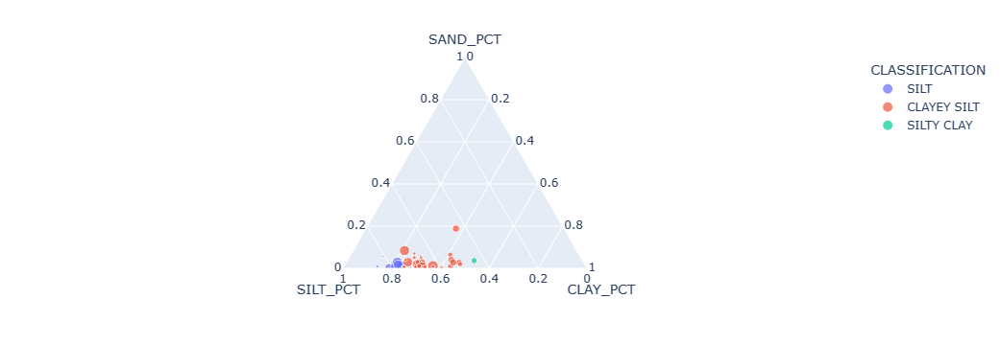

In [83]:
fig = px.scatter_ternary(
                        df_CHESAPEAKE_BAY_,
                        a = 'SAND_PCT',
                        b = 'SILT_PCT',
                        c = 'CLAY_PCT',
                        color = "CLASSIFICATION",
                        size = "WEIGHT",
                        size_max = 10
                        )

fig.show()

In [93]:
df_CHESAPEAKE_BAY = df_CHESAPEAKE_BAY.query("DEPTH_M > 0")

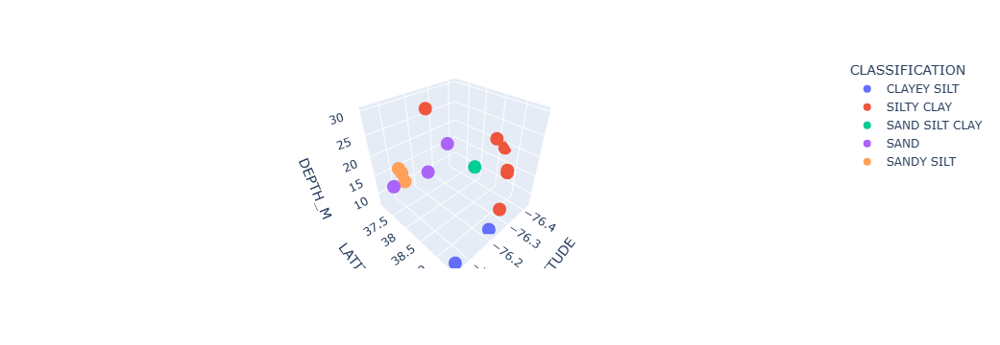

In [94]:
fig = px.scatter_3d(
                    df_CHESAPEAKE_BAY,
                    x='LONGITUDE',
                    y='LATITUDE',
                    z='DEPTH_M',
                    color='CLASSIFICATION'
                    )
fig.show()